In [1]:
# force geopandas to use shapely instead of pygeos
import os
os.environ['USE_PYGEOS'] = '0'

import numpy as np
import pandas as pd
import plotly.express as px
from shapely import wkt
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# reading in data and visualizing first few rows

df = pd.read_csv("../data/data_2022_with_geom.csv")
df.head()

,Citation Number,Citation Issued DateTime,Violation,Violation Description,Citation Location,Vehicle Plate State,Vehicle Plate,Fine Amount,Date Added,geom
0,950226616,2022-04-20 12:10:00,TRC7.2.22,STR CLEAN,1318 FILBERT ST,CA,V507699,84.0,05/01/2022 12:00:00 AM,POINT (-122.42119800399996 37.800016984000024)
1,952126114,2022-06-17 16:12:00,TRC7.2.20,RES/OT,1318 FILBERT ST,CA,BV44D97,96.0,07/17/2022 12:00:00 AM,POINT (-122.42119800399996 37.800016984000024)
2,950441903,2022-04-23 15:13:00,V5200,NO PLATES,1318 FILBERT ST,CA,V507699,121.0,05/18/2022 12:00:00 AM,POINT (-122.42119800399996 37.800016984000024)
3,948460144,2022-02-22 11:54:00,TRC7.2.20,RES/OT,1318 FILBERT ST,TX,HVT6737,96.0,05/23/2022 12:00:00 AM,POINT (-122.42119800399996 37.800016984000024)
4,948169644,2022-02-17 13:39:00,TRC7.2.20,RES/OT,1318 FILBERT ST,OH,HQA6554,96.0,04/03/2022 12:00:00 AM,POINT (-122.42119800399996 37.800016984000024)


In [3]:
# datatypes
df.dtypes

Citation Number              object
Citation Issued DateTime     object
Violation                    object
Violation Description        object
Citation Location            object
Vehicle Plate State          object
Vehicle Plate                object
Fine Amount                 float64
Date Added                   object
geom                         object
dtype: object

In [3]:
# converts to GeoDataFrame for map plots. takes about 30 seconds

# df['geom'] = df['geom'].apply(lambda x: Point([float(y) for y in x.split(',')]))
df['geom'] = df.geom.apply(wkt.loads)
df = gpd.GeoDataFrame(df, geometry='geom')
df.crs = 'EPSG:4326'


In [4]:
# plot first 10000 citation locations
df.head(n=10000).explore()

In [5]:
# converting to datetime
df['Citation Issued DateTime'] = pd.to_datetime(df['Citation Issued DateTime'])

In [6]:
# viewing dates
df['Citation Issued DateTime'].dt.date

0          2022-04-20
1          2022-06-17
2          2022-04-23
3          2022-02-22
4          2022-02-17
              ...    
1127684    2022-10-15
1127685    2022-10-04
1127686    2022-11-02
1127687    2022-11-02
1127688    2022-11-03
Name: Citation Issued DateTime, Length: 1127689, dtype: object

<AxesSubplot: >

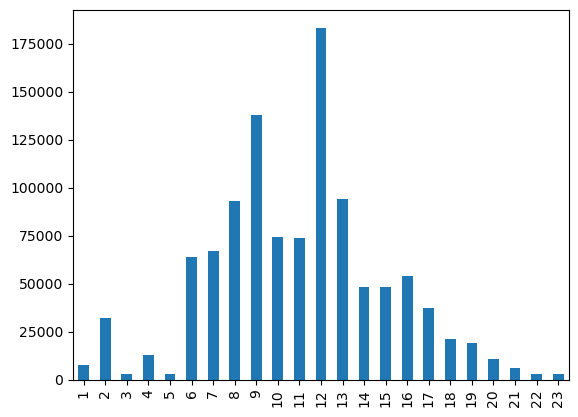

In [7]:
# tickets by hour of the day
df['Citation Issued DateTime'].dt.hour.value_counts().loc[range(1, 24)].plot.bar()

<AxesSubplot: >

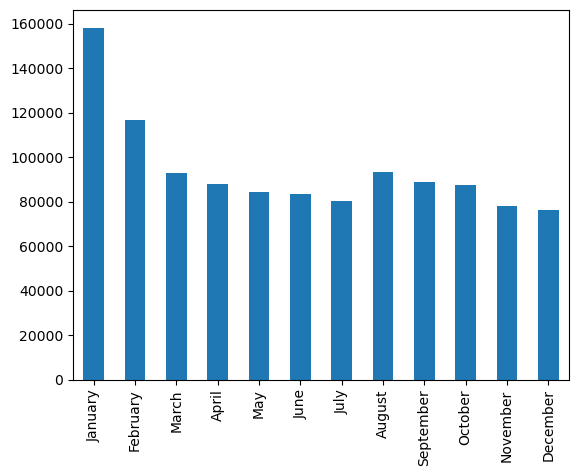

In [8]:
# tickets by month

months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df['Citation Issued DateTime'].dt.month_name().value_counts().loc[months].plot.bar()

<AxesSubplot: >

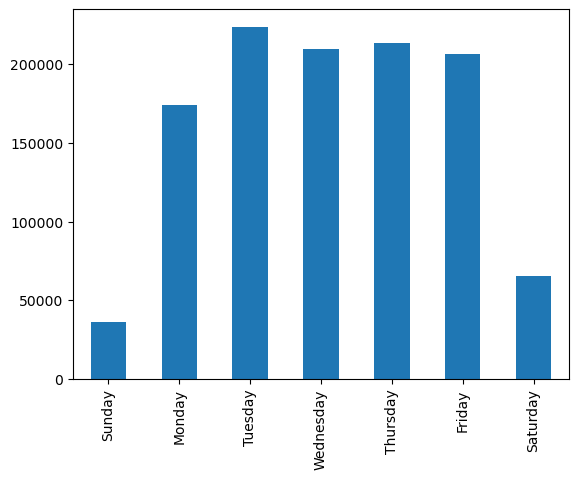

In [52]:
# tickets by day of the week

days = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]
df['Citation Issued DateTime'].dt.day_name().value_counts().loc[days].plot.bar()

<AxesSubplot: >

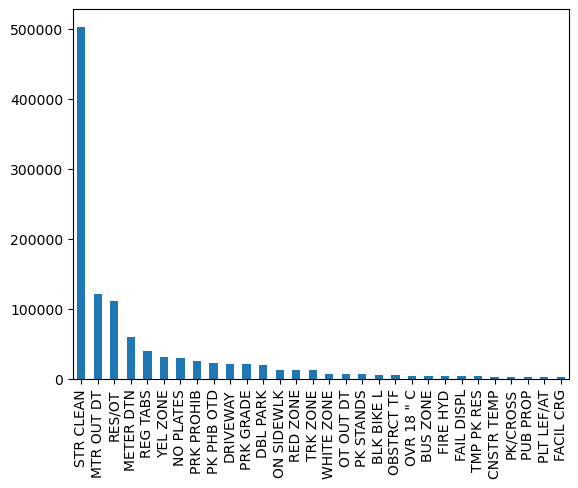

In [4]:
# 30 most common violation types

df["Violation Description"].value_counts().head(n=30).plot.bar()

In [6]:
# top 10 areas with the most citations

num_citations_by_location = df['Citation Location'].value_counts()
gb_first = df.groupby('Citation Location').nth(0)

citation_df = gpd.GeoDataFrame(pd.merge(num_citations_by_location, gb_first, left_index=True, right_on='Citation Location'), geometry='geom')
citation_df.rename({'Citation Location': 'citation_count'}, axis=1, inplace=True)
citation_df.head(n=10)['citation_count']

Citation Location
501 TERRY A FRANCOIS BLVD         1424
993 POTRERO AVE                    589
200 CHANNEL ST                     575
492 CASTRO ST                      519
100 SPEAR ST                       444
300 FREMONT ST                     420
501 TERRY A FRANCOIS BOULEVARD     406
3252 PIERCE ST                     380
EMBARCADERO STATION                343
500 HOWARD ST                      331
Name: citation_count, dtype: int64

<AxesSubplot: xlabel='Citation Location'>

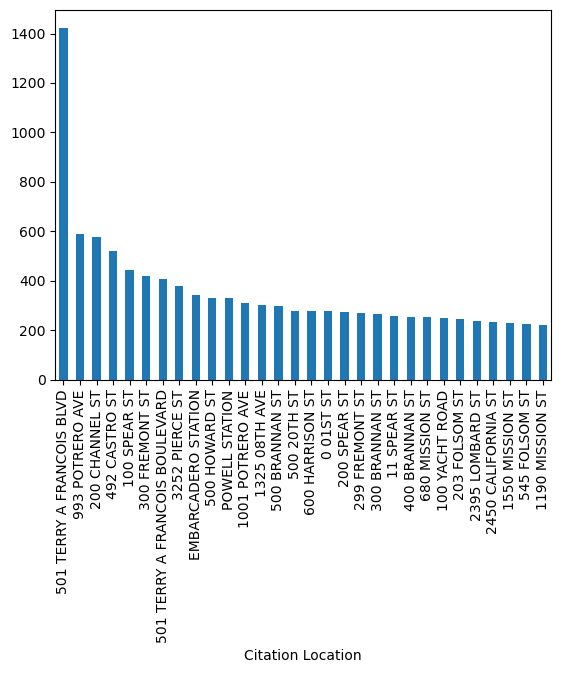

In [10]:
# bar plot of top 30 areas with the most citations

citation_df.head(n=30)['citation_count'].plot(kind='bar')

In [9]:
# map of number of street cleaning citations

str = citation_df[citation_df["Violation Description"] == "STR CLEAN"]
#str.head(10000).explore()
str.sample(10000).explore("citation_count")


TypeError: Object of type Timestamp is not JSON serializable

In [45]:
# map of citations grouped by fine amount
# map of citations grouped by citation type

#citation_df.head(10000).explore("Fine Amount")
#df.sample(10000).explore("Violation Description")

In [10]:
# map of where top 10 most common violations occurred

top10_vio = df["Violation Description"].value_counts().head(10).index.tolist()
df_top10 = df[df["Violation Description"].isin(top10_vio)]
df_top10.sample(10000).explore("Violation Description")


TypeError: Object of type Timestamp is not JSON serializable

<AxesSubplot: >

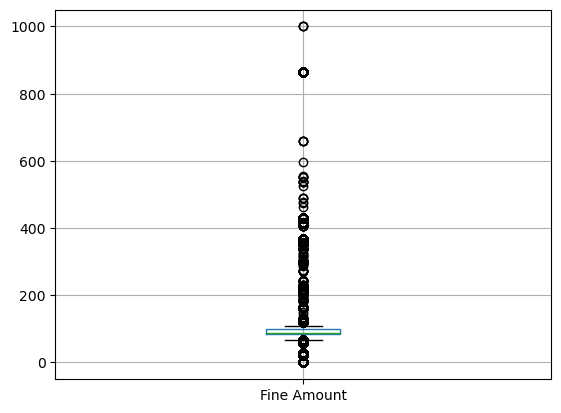

In [11]:
# boxplot of fine amounts
df[["Fine Amount"]].boxplot()
#sns.boxplot(df["Fine Amount"])